# Social Data Analysis and Visualization (02806)

# Final Project - explainer notebook

May 10, 2022

* Andreas Ammitzbøll, s174513
* Mads Westermann, s174508
* Rikke Rasmussen, s174493

In [3]:
# Install needed packages (for Google Colab)

!pip install geopandas
!pip install mapclassify
!pip install --upgrade folium

     |████████████████████████████████| 1.0 MB 6.8 MB/s 
     |████████████████████████████████| 16.7 MB 49.8 MB/s 
     |████████████████████████████████| 6.3 MB 50.4 MB/s 
     |████████████████████████████████| 95 kB 3.2 MB/s 
  Attempting uninstall: folium
    Found existing installation: folium 0.8.3
    Uninstalling folium-0.8.3:
      Successfully uninstalled folium-0.8.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.12.1.post1 which is incompatible.


In [4]:
import os
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from math import ceil
from pyproj import Proj
import folium

from bokeh.io import show, save, output_notebook
from bokeh.layouts import gridplot
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure
from bokeh.models import HoverTool
from bokeh.models.formatters import NumeralTickFormatter
output_notebook()

## 1. Motivation

In this project we investigate the relationship between the geographical locations of wind turbines in Denmark and different social and geographical characteristics of the Danish municipalities. To do this we use datasets from four sources (described more in-depth in the next section):

1. A wind turbine dataset from Energistyrelsen
2. Danish municipality data from Danmarks Statistik
3. Wind speed data from DMI
4. Geodata on municipality borders from information.dk

The wind turbine dataset is essential since it contains information about the placement of the Danish wind turbines. Data on municipalities are also essential if we are to analyze the relationship between the wind turbines and municipal properties. The wind speed data from DMI is on a municipal level and is another characteristic of the municipalities that we use in our data analysis. Lastly, the geodata allows us to make a choropleth map using the data from the other data sets.

Our goal has been to investigate many different factors that could influence the decision for where land-based wind turbines are placed.

## 2. Basic stats

The wind turbine dataset is an excel file which we download from [Energistyrelsen's website](https://ens.dk/service/statistik-data-noegletal-og-kort/data-oversigt-over-energisektoren). The size of the file is 3.9 MB.

In [5]:
#--- Import wind turbine data from Energistyrelsen ---#

# import wind turbine data from energistyrelsen
df_turbines = pd.read_excel("https://github.com/s174508/SocialData/raw/main/data/anlaeg.xlsx", header=17, usecols="A:N")

# discard last three rows
df_turbines = df_turbines.drop([6298,6297,6296], axis=0)

# rename data columns
columns = ["ID", "Tilsluttet", "Kapacitet (kW)", "Rotor-diameter (m)", "Navhøjde (m)", "Fabrikat",
           "Model", "Kommune-nr.", "Kommune", "Placering", "Ejerlav", "Matrikel-nummer", "X", "Y"]
df_turbines.columns = columns

print(f"We import the first {len(df_turbines.columns)} columns (variables) of the wind turbine dataset and all {len(df_turbines)} rows (individual wind turbines). Below is a sample.")

df_turbines.sample()

We import the first 14 columns (variables) of the wind turbine dataset and all 6296 rows (individual wind turbines). Below is a sample.


,ID,Tilsluttet,Kapacitet (kW),Rotor-diameter (m),Navhøjde (m),Fabrikat,Model,Kommune-nr.,Kommune,Placering,Ejerlav,Matrikel-nummer,X,Y
4574,571313113162035479,2015-11-03,10.0,7.1,21.4,Ukendt,Ukendt,779.0,Skive,Land,NaN,NaN,490611.57,6274952.06


Our preprocessing of the wind turbine data consists of:
* In some cases the municipality- or placement information doesn't match the coordinates. By using maps we've been able to determine their true municipality/placement.
* The `Placering` column contains strings with inconsistent casing so we convert it to lower case.
* Turbines which are not placed on land are discarded.
* The geographical positions of the turbines have been registered in [utm32 coordinates](https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system). We convert these to latitude, longitude coordinates.
* The two municipalities Aalborg and Aarhus are sometimes spelled with "Å" instead of "Aa". To ensure spelling consistency with the other datasets, we replace all spelling instances containing of "Ålborg" and "Århus" with "Aalborg" and "Aarhus", respectively.
* Any data entry which is missing either its geographical location or its municipality is removed since we can't use them in our analysis.
* Finally, we get rid of the columns which we won't use in the upcoming analysis. The columns of interest are `ID`, `Kapacitet (kW)`, `Kommune`, `lat`, and `lon`.

In [6]:
#--- Clean up wind turbine data ---#

# Correct wind turbines with wrong municipality information
df_turbines.loc[df_turbines['ID'] == '570715000001456465', 'Kommune'] = 'Aalborg'
df_turbines.loc[df_turbines['ID'] == '570715000001669469', 'Kommune'] = 'Thisted'
df_turbines.loc[df_turbines['ID'] == '570715000000092930', 'Kommune'] = 'Ringkøbing-Skjern'
df_turbines.loc[df_turbines['ID'] == '570715000000037924', 'Kommune'] = 'Lemvig'
df_turbines.loc[df_turbines['ID'] == '571313134700402836', 'Kommune'] = 'Lemvig'
df_turbines.loc[df_turbines['ID'] == '570715000001454317', 'Kommune'] = 'Ringkøbing-Skjern'
df_turbines.loc[df_turbines['ID'] == '571313113162032997', 'Kommune'] = 'Silkeborg'

# Correct turbines with wrong placement information
df_turbines.loc[df_turbines['ID'] == '570715000002077638', 'Placering'] = 'hav'
df_turbines.loc[df_turbines['ID'] == '570715000000057465', 'Placering'] = 'land'
df_turbines.loc[df_turbines['ID'] == '570715000000057472', 'Placering'] = 'land'

# Convert strings to lowercase
df_turbines["Placering"] = df_turbines["Placering"].str.lower()

# Remove turbines that are placed at sea
df_turbines = df_turbines[df_turbines['Placering'] == 'land']

# Convert utm coordinates into latitude and longitude
proj = Proj(proj="utm", zone=32)
lon, lat = proj(df_turbines["X"].values, df_turbines["Y"].values, inverse=True)
df_turbines["lat"] = lat
df_turbines["lon"] = lon

# Rename a few municipalities for consistency
df_turbines = df_turbines.replace({'Ålborg':'Aalborg', 'Århus':'Aarhus'})

# Remove entries that are missing location or municipality (615 entries)
df_turbines = df_turbines[df_turbines['lat'] != np.inf]
df_turbines = df_turbines[df_turbines['Kommune'].notna()]

# Keep columns used in the analysis, discard the rest
df_turbines = df_turbines[["ID", "Kapacitet (kW)", "Kommune", "lat", "lon"]]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


The columns in our dataframe:

1. `ID`: a unique id number for each turbine,
2. `Kapacitet (kW)`: the capacity of the turbine measured in kW,
3. `Kommune`: the name of the municipality in which the turbine is located,
4. `lat`: geographical position, latitude,
5. `lon`: geographical position, longitude.

We now use the cleaned up turbine data to create some aggregate data for the municipalities of Denmark. We count the number of land-based wind turbines in each municipality and compute the total kW capacity of these turbines. This data is stored in a new dataframe.

In [7]:
#--- Create a DataFrame for municipality information ---#

municipalities = ['Aabenraa', 'Aalborg', 'Aarhus', 'Albertslund', 'Allerød', 'Assens',
                  'Ballerup', 'Billund', 'Bornholm', 'Brøndby', 'Brønderslev', 'Dragør',
                  'Egedal', 'Esbjerg', 'Faaborg-Midtfyn', 'Fanø', 'Favrskov', 'Faxe',
                  'Fredensborg', 'Fredericia', 'Frederiksberg', 'Frederikshavn',
                  'Frederikssund', 'Furesø', 'Gentofte', 'Gladsaxe', 'Glostrup', 'Greve',
                  'Gribskov', 'Guldborgsund', 'Haderslev', 'Halsnæs', 'Hedensted',
                  'Helsingør', 'Herlev', 'Herning', 'Hillerød', 'Hjørring', 'Holbæk',
                  'Holstebro', 'Horsens', 'Hvidovre', 'Høje-Taastrup', 'Hørsholm',
                  'Ikast-Brande', 'Ishøj', 'Jammerbugt', 'Kalundborg', 'Kerteminde',
                  'Kolding', 'København', 'Køge', 'Langeland', 'Lejre', 'Lemvig',
                  'Lolland', 'Lyngby-Taarbæk', 'Læsø', 'Mariagerfjord', 'Middelfart',
                  'Morsø', 'Norddjurs', 'Nordfyns', 'Nyborg', 'Næstved', 'Odder',
                  'Odense', 'Odsherred', 'Randers', 'Rebild', 'Ringkøbing-Skjern',
                  'Ringsted', 'Roskilde', 'Rudersdal', 'Rødovre', 'Samsø', 'Silkeborg',
                  'Skanderborg', 'Skive', 'Slagelse', 'Solrød', 'Sorø', 'Stevns',
                  'Struer', 'Svendborg', 'Syddjurs', 'Sønderborg', 'Thisted', 'Tårnby',
                  'Tønder', 'Vallensbæk', 'Varde', 'Vejen', 'Vejle', 'Vesthimmerlands',
                  'Viborg', 'Vordingborg', 'Ærø']


# For each municipality compute number of land turbines and total capacity
df_count = df_turbines[['Kommune', 'ID']].groupby('Kommune').count().T
df_kWsum = df_turbines[['Kommune', 'Kapacitet (kW)']].groupby('Kommune').sum().T
indexes = df_count.columns
list_count = []
list_kWsum = []

# Put 0 for municipalities with no wind turbines
for muni in municipalities:
    if muni in indexes:
        list_count.append(df_count[muni][0])
        list_kWsum.append(df_kWsum[muni][0])
    else:
        list_count.append(0)
        list_kWsum.append(0)

# Create the DataFrame
df_muni = pd.DataFrame(list_count, index=municipalities, columns=['Turbines'])
df_muni['kWsum'] = list_kWsum

We download and process additional municipality data which we obtain from Danmarks Statistik in the form of four excel files each of which contains a row for each Danish municipality (98 rows): 
* [`MuniArea`](https://www.statistikbanken.dk/statbank5a/SelectVarVal/Define.asp?MainTable=AREALDK): the area (measured in $\text{km}^2$) of each Danish municipality for 2018. Size: 9.7 kB.
* [`Folketal`](https://www.statistikbanken.dk/FOLK1A): the number of citizens in each municipality as of for first quarter of 2022. Size: 9.7 kB.
* [`Indkomst`](https://www.statistikbanken.dk/INDKP105): the average income of citizens (measured in kr.) in each municipality for 2020. Size: 10.0 kB.
* [`Landskab`](https://www.statistikbanken.dk/statbank5a/SelectVarVal/Define.asp?MainTable=AREALDK): the amounts (measured in %) of different types of landscape (10 types) in each municipality for 2018. Size: 13.8 kB.

**Note:** `MuniArea` and `Landskab` are from the same source but with a different choice of unit.

We append the area data and income data to our municipality dataset. Using what we computed previously, we use the area data to compute the number of turbines pr. $\text{km}^2$, the turbine capacity pr. $\text{km}^2$, and the number of citizens pr. $\text{km}^2$ for each municipality. For the landscape data, we deem that the two landscape types "landbrugsafgrøder" (farmland) and "heder, klitter og anden tør natur" (heaths, dunes and other dry nature) are suitable for the placement of wind turbines. We sum the percentages of these in a `Suited area (%)` column. The percentages of the remaining types of landscape are summed into a `Unsuited area (%)` column, except for unclassified area which is kept in a separate column.

In [8]:
#--- Add municipality data from Danmarks Statistik to the DataFrame ---#

# Import municipality size
df_muni['Area (km2)'] = pd.read_excel('https://github.com/s174508/SocialData/raw/main/data/MuniArea.xlsx', header=2, index_col=0, usecols='C:D')\
        .sort_index()['2018'].to_list()

# Compute number of turbines pr km2
df_muni['Turbines pr km2'] = (df_muni['Turbines'] / df_muni['Area (km2)']).round(1)

# Compute amount of kW pr km2
df_muni['kW pr km2'] = (df_muni['kWsum'] / df_muni['Area (km2)']).round(1)

# Import citizen number
df_muni['Citizens pr km2'] = \
    pd.read_excel('https://github.com/s174508/SocialData/raw/main/data/Folketal.xlsx', header=2, index_col=0, usecols='D:E').sort_index()['2022K1'] / df_muni['Area (km2)']
df_muni['Citizens pr km2'] = df_muni['Citizens pr km2'].round(1)

# Import mean income
df_muni['Avg. income 2020 (kr)'] = \
    pd.read_excel('https://github.com/s174508/SocialData/raw/main/data/Indkomst.xlsx', header=2, index_col=0, usecols='E:F', skiprows=[101,102]).sort_index()

# Import terrain data
df_landskab = pd.read_excel('https://github.com/s174508/SocialData/raw/main/data/Landskab.xlsx', header=2, index_col=0, usecols="C:M", skiprows=[101,102]).sort_index()
df_muni['Suited area (%)'] = df_landskab[['Landbrugsafgrøder', 'Heder, klitter og anden tør natur']].sum(axis=1)
df_muni['Unsuited area (%)'] = df_landskab[['Veje, jernbaner og landingsbaner',
                                            'Bygninger og bebyggede områder',
                                            'Råstofindvindingsområder (grusgrave og lign.)',
                                            'Parker, sportsanlæg og andre rekreative områder',
                                            'Skov',
                                            'Enge, moser og anden våd natur', 'Søer og vandløb']].sum(axis=1)
df_muni['Unclassified area (%)'] = df_landskab['Ikke klassificeret']

We have obtained [wind speed data](https://www.dmi.dk/lokationarkiv) for each municipality from DMI (Meterological Institute of Denmark). The data is registered in a separate excel file for each municipality (98 files). These files contain a record of the average wind speed in the given municipality for the years 2011-2022. We merge all the files into a single excel file (`Wind`) of size 11.6 kB. In this file we compute the mean of the yearly average wind speed of each municipality which will be used in our analysis.

In [9]:
# This cell is for converting the 98 small wind speed datasets into one bigger dataset
# We have chosen to upload the big dataset instead of the small ones, so you won't be able to run this code

"""
#--- Export average wind speed data from dmi.dk to an excel file ---# 

# Folder with the data sets
directory = 'vind_kommuner_data'

i = 0
# Iterate over all files in the folder
for filename in os.listdir(directory):
    filepath = os.path.join(directory, filename)
    
    if i == 0:
        df = pd.read_csv(filepath, sep=';')

        datetimes = pd.to_datetime(df['DateTime'], format='%Y-%m-%d %H:%M:%S')
        df['Year'] = pd.DatetimeIndex(datetimes).year
        df[filename] = (df['Middel vindhastighed'].str.replace(',','.')).astype(float)
        df = df.set_index('Year')
        df.index.name = None

        df = df.drop(columns=['DateTime','Højeste 10 min. middel','Højeste vindstød','Middel vindhastighed'])
    
    else:
        temp = pd.read_csv(filepath, sep=';')
        datetimes = pd.to_datetime(temp['DateTime'], format='%Y-%m-%d %H:%M:%S')
        temp['Year'] = pd.DatetimeIndex(datetimes).year
        temp = temp.set_index('Year')
        df[filename] = (temp['Middel vindhastighed'].str.replace(',','.')).astype(float)
        
    i += 1

df = df.T # Transpose dataframe
df['Mean'] = df.mean(axis=1)
df = df.reset_index().rename(columns={'index': 'Municipality'})
df['Municipality'] = df['Municipality'].str.replace('-kommune.csv','', regex=False) # remove string endings
df['Municipality'] = df['Municipality'].str.title() # capitalize start letters
df = df.replace({'Københavns':'København'})#[df['Municipality']=='Københavns'] = 'København'

df.to_excel("Wind.xlsx")
"""

print()

In [10]:
df_muni['Avg. wind speed (m/s)'] = pd.read_excel('https://github.com/s174508/SocialData/raw/main/data/Wind.xlsx', index_col=0)['Mean'].round(1).to_list()

Dagbladet Information provides geodata for the Danish municipalities (and many other things) through their [Information Lab](https://lab.information.dk/). We have chosen the version in 1:500,000 (2.1 MB) which should be more than detailed enough. The dataset contains polygons describing all municipalities of Denmark (municipalities with disconnected landmasses have one polygon for each), the name of the municipality and additional regional and municipal information. We won't be working with this dataset until the Visualizations part though.

We have now prepared all the data we need for the upcoming analysis. The data we use during the analysis consists of two dataframes. One contains the wind turbine data and consists of 5 columns and 5051 rows. The other contains the municipality data and consists of 11 columns and 98 rows. Below can be seen a sample row from each dataframe:

In [11]:
df_turbines.sample()

,ID,Kapacitet (kW),Kommune,lat,lon
1339,570715000000055522,600.0,Svendborg,55.095969,10.403796


In [12]:
df_muni.sample()

,Turbines,kWsum,Area (km2),Turbines pr km2,kW pr km2,Citizens pr km2,Avg. income 2020 (kr),Suited area (%),Unsuited area (%),Unclassified area (%),Avg. wind speed (m/s)
Fredericia,4,2250.0,133.2,0.0,16.9,387.4,334068,47.5,49.9,2.6,4.8


To explore our data, we plot histograms for selected columns in the two dataframes, to illustrate the distributions of these data variables. The bin widths in the histograms are calculated using [Freedman-Diaconis' choice](https://en.wikipedia.org/wiki/Histogram#Freedman%E2%80%93Diaconis'_choice).

In [13]:
def bins_FD(data):
    """Compute histogram bin widths using Freedman-Diaconis' choice"""
    IQR = data.quantile(0.75) - data.quantile(0.25)
    h = ceil(2 * IQR * (len(data)**(-1/3)))
    bins = np.ceil((data.max() - data.min()) / h).astype(int)
    return bins

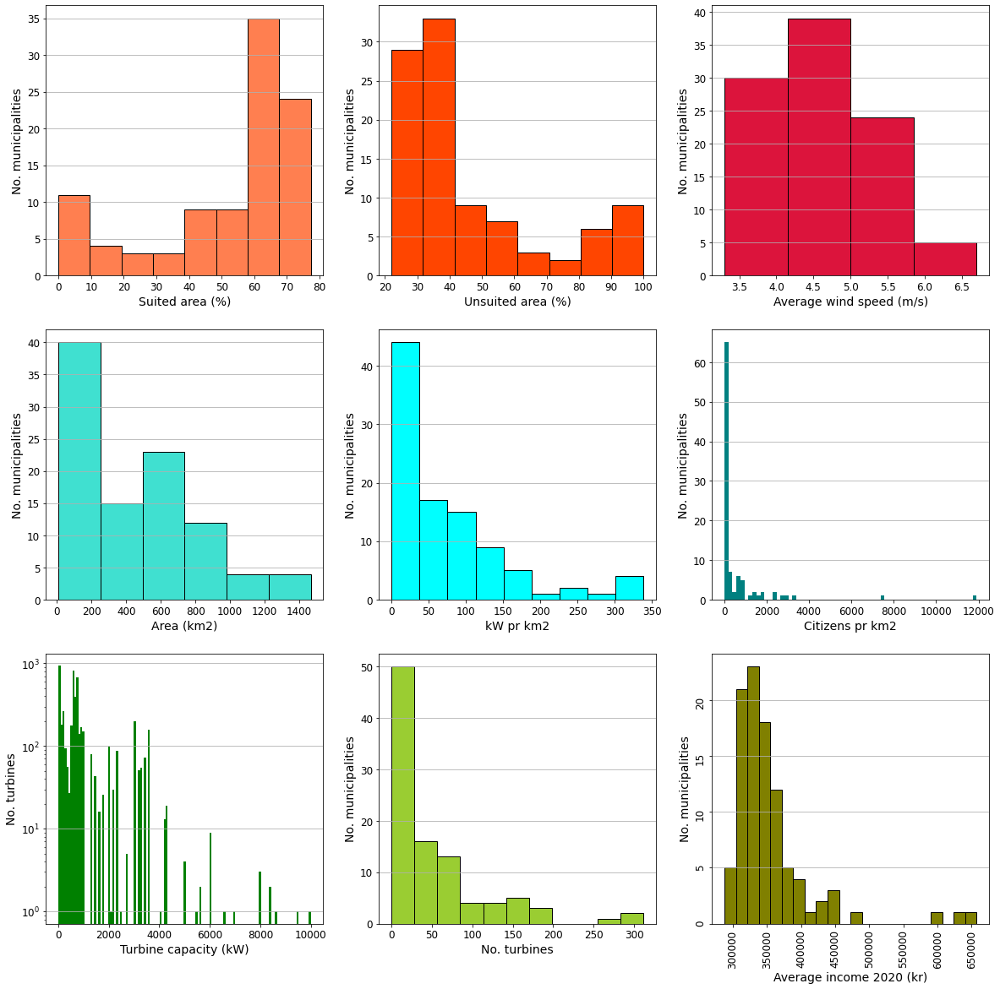

In [14]:
fig, axes = plt.subplots(3,3, figsize=(20,20))

axes[0][0].hist(df_muni['Suited area (%)'], bins=bins_FD(df_muni['Suited area (%)']), color='coral', edgecolor='black')
axes[0][0].set_xlabel('Suited area (%)', fontsize=14)
axes[0][0].set_ylabel('No. municipalities', fontsize=14)
axes[0][0].tick_params(labelsize=12)
axes[0][0].grid(axis='y')

axes[0][1].hist(df_muni['Unsuited area (%)'], bins=bins_FD(df_muni['Unsuited area (%)']), color='orangered', edgecolor='black')
axes[0][1].set_xlabel('Unsuited area (%)', fontsize=14)
axes[0][1].set_ylabel('No. municipalities', fontsize=14)
axes[0][1].tick_params(labelsize=12)
axes[0][1].grid(axis='y')

axes[0][2].hist(df_muni['Avg. wind speed (m/s)'], bins=bins_FD(df_muni['Avg. wind speed (m/s)']), color='crimson', edgecolor='black')
axes[0][2].set_xlabel('Average wind speed (m/s)', fontsize=14)
axes[0][2].set_ylabel('No. municipalities', fontsize=14)
axes[0][2].tick_params(labelsize=12)
axes[0][2].grid(axis='y')

axes[1][0].hist(df_muni['Area (km2)'], bins=bins_FD(df_muni['Area (km2)']), color='turquoise', edgecolor='black')
axes[1][0].set_xlabel('Area (km2)', fontsize=14)
axes[1][0].set_ylabel('No. municipalities', fontsize=14)
axes[1][0].tick_params(labelsize=12)
axes[1][0].grid(axis='y')

axes[1][1].hist(df_muni['kW pr km2'], bins=bins_FD(df_muni['kW pr km2']), color='cyan', edgecolor='black')
axes[1][1].set_xlabel('kW pr km2', fontsize=14)
axes[1][1].set_ylabel('No. municipalities', fontsize=14)
axes[1][1].tick_params(labelsize=12)
axes[1][1].grid(axis='y')

axes[1][2].hist(df_muni['Citizens pr km2'], bins=bins_FD(df_muni['Citizens pr km2']), color='teal')
axes[1][2].set_xlabel('Citizens pr km2', fontsize=14)
axes[1][2].set_ylabel('No. municipalities', fontsize=14)
axes[1][2].tick_params(labelsize=12)
axes[1][2].grid(axis='y')

axes[2][0].hist(df_turbines['Kapacitet (kW)'], bins=bins_FD(df_turbines['Kapacitet (kW)']), color='green')
axes[2][0].set_yscale('log')
axes[2][0].set_xlabel('Turbine capacity (kW)', fontsize=14)
axes[2][0].set_ylabel('No. turbines', fontsize=14)
axes[2][0].tick_params(labelsize=12)
axes[2][0].grid(axis='y')

axes[2][1].hist(df_muni['Turbines'], bins=bins_FD(df_muni['Turbines']), color='yellowgreen', edgecolor='black')
axes[2][1].set_xlabel('No. turbines', fontsize=14)
axes[2][1].set_ylabel('No. municipalities', fontsize=14)
axes[2][1].tick_params(labelsize=12)
axes[2][1].grid(axis='y')

axes[2][2].hist(df_muni['Avg. income 2020 (kr)'], bins=bins_FD(df_muni['Avg. income 2020 (kr)']), color='olive', edgecolor='black')
axes[2][2].set_xlabel('Average income 2020 (kr)', fontsize=14)
axes[2][2].set_ylabel('No. municipalities', fontsize=14)
axes[2][2].tick_params(labelsize=12, labelrotation=90)
axes[2][2].grid(axis='y')

fig.show()

**Figure 1:** Histograms of selected columns in the datasets. The histograms reveal that some municipalities stand out from the rest in terms of the kW pr km2, citizens pr km2, the number of turbines, and average income. 

To explore the distributions of the data variables further, we now make a box plot for each of the variables that we have plotted histograms for above.

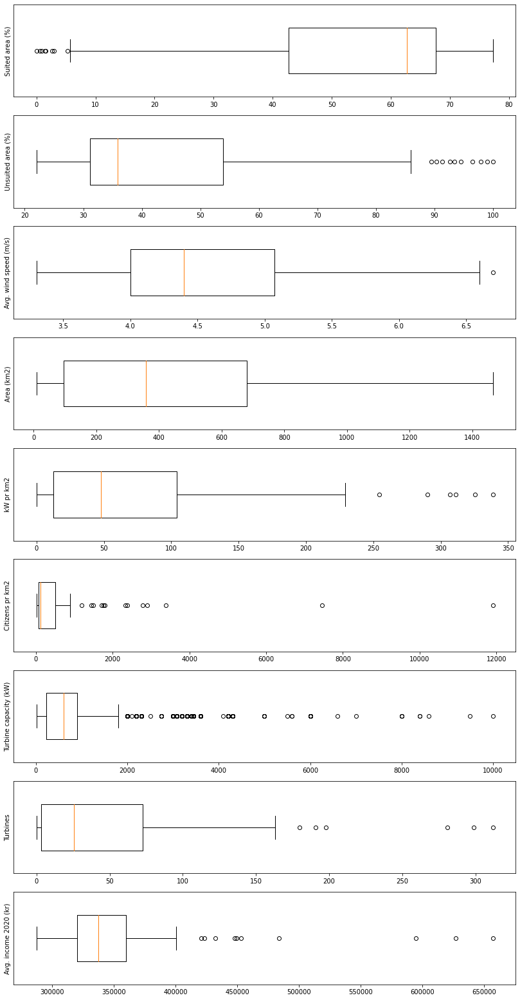

In [15]:
fig, axes = plt.subplots(9,1, figsize=(14,28))

axes[0].boxplot(x=df_muni['Suited area (%)'], vert=False, widths=0.5)
axes[0].set_yticks([])
axes[0].set_ylabel('Suited area (%)')

axes[1].boxplot(x=df_muni['Unsuited area (%)'], vert=False, widths=0.5)
axes[1].set_yticks([])
axes[1].set_ylabel('Unsuited area (%)')

axes[2].boxplot(x=df_muni['Avg. wind speed (m/s)'], vert=False, widths=0.5)
axes[2].set_yticks([])
axes[2].set_ylabel('Avg. wind speed (m/s)')

axes[3].boxplot(x=df_muni['Area (km2)'], vert=False, widths=0.5)
axes[3].set_yticks([])
axes[3].set_ylabel('Area (km2)')

axes[4].boxplot(x=df_muni['kW pr km2'], vert=False, widths=0.5)
axes[4].set_yticks([])
axes[4].set_ylabel('kW pr km2')

axes[5].boxplot(x=df_muni['Citizens pr km2'], vert=False, widths=0.5)
axes[5].set_yticks([])
axes[5].set_ylabel('Citizens pr km2')

axes[6].boxplot(x=df_turbines['Kapacitet (kW)'], vert=False, widths=0.5)
axes[6].set_yticks([])
axes[6].set_ylabel('Turbine capacity (kW)')

axes[7].boxplot(x=df_muni['Turbines'], vert=False, widths=0.5)
axes[7].set_yticks([])
axes[7].set_ylabel('Turbines')

axes[8].boxplot(x=df_muni['Avg. income 2020 (kr)'], vert=False, widths=0.5)
axes[8].set_yticks([])
axes[8].set_ylabel('Avg. income 2020 (kr)')

fig.show()

**Figure 2:** Boxplots for selected columns in the datasets. These plots clearly illustrate the summary statistics (median, 1st quantile, 3rd quantile)  and the outlying data points, particularly when it comes to kW pr km2, population density, turbine capacity and number of turbines, as well as average income.

The code below creates the box plots for the turbine capacity and the average income separately for use in our article.

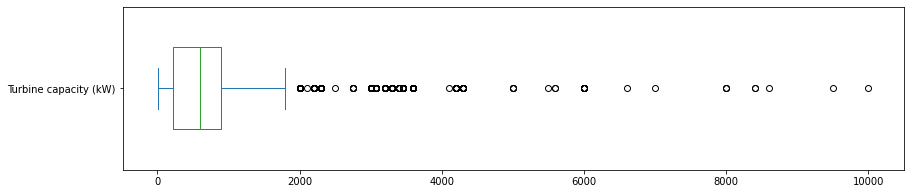

In [16]:

# rename column for plot
df_turbines.columns = ['ID', 'Turbine capacity (kW)', 'Kommune', 'lat', 'lon']

fig, ax = plt.subplots(figsize=(14,3))
df_turbines['Turbine capacity (kW)'].plot.box(vert = False, ax=ax, widths=0.5)
#plt.savefig('boxplot_kW.png', dpi=300, facecolor="#F4F4F4")

# reset column name
df_turbines.columns = ['ID', 'Kapacitet (kW)', 'Kommune', 'lat', 'lon']

**Figure 3:** Boxplot of the turbine capacity for the different turbines in the dataset.

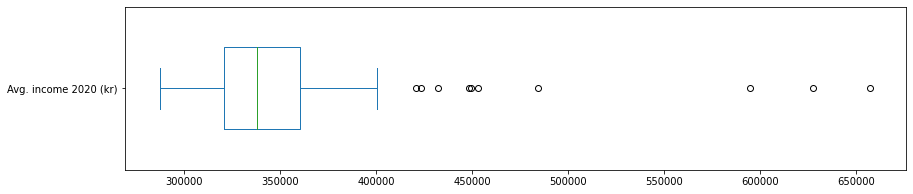

In [17]:
fig, ax = plt.subplots(figsize=(14,3))
df_muni['Avg. income 2020 (kr)'].plot.box(vert = False, ax=ax, widths=0.5)
#plt.savefig('boxplot_inc.png', dpi=300, facecolor="#F4F4F4")

**Figure 4:** Boxplot of the average income in the Danish municipalities.

## 3. Data Analysis

We have now come to our data analysis where we will investigate possible relations/trends between the amount of wind turbines and other municipal factors. We will be using the previously calculated `kW pr km2` as our measure because it takes into consideration both the size of different municipalities and how beneficial individual turbines are. 

We will conduct the investigation through scatter plots because they are well-suited for visually discovering relations between a pair of parameters. We plot `kW pr km2` against all the municipal factors we could find that we thought might explain the amount of turbines.

In [18]:
#--- Make a scatter plot for capacities and income ---#

source = ColumnDataSource(data=df_muni)

tools = 'pan, wheel_zoom, reset'
x = 'Avg. income 2020 (kr)'
y = 'kW pr km2'
plot = figure(tools=tools, tooltips=[('Municipality', '@index')], x_axis_label=x, y_axis_label=y, 
              title='Avg. income vs. kW pr km2', height=400, width=400)
plot.xaxis[0].formatter = NumeralTickFormatter(format="0,0")
plot.circle(x, y, source=source, size=6)
plot.border_fill_color = "#F4F4F4"

#save(plot, "scatter_inc.html")
show(plot)

**Figure 5:** Scatter plot of the average income and kW pr km2. 

The scatter plot shows clearly that the municipalities with the highest income haven't invested much in wind turbines. Looking for a trend is slightly more challenging though. The scatter plot may appear to be exponentially decreasing with higher income, but that is mostly due to the few high-income municipalities. We saw earlier with the boxplot of the average income that the 10 municipalities with the highest income are outliers, and if we disregard those for a moment it seems that the remaining points lie much more arbitrarily. Therefore we don't recognize a general trend when it comes to the relation between income and turbines, but we do recognize that the municipalities with highest income indeed don't have a lot of turbines.

We will now create more scatter plots for exploring some additional features to see if they show any trends with `kW pr km2`.

In [19]:
#--- Make scatterplots for some other feature combinations ---#

source = ColumnDataSource(data=df_muni)

# (x, y, x-axis scale, title)
combinations = [('Avg. income 2020 (kr)', 'kW pr km2', 'linear', 'Avg. income vs. kW pr km2'),
                ('Citizens pr km2','kW pr km2','log','Population density vs. kW pr km2'),
                ('Suited area (%)','kW pr km2','linear','Suited area vs. kW pr km2'),
                ('Avg. wind speed (m/s)','kW pr km2','linear','Wind speed vs kW pr km2')]
tools = 'pan, wheel_zoom, tap, reset'
size = 6

plots = []
for (x,y,x_axis, title) in combinations:
    tooltips = [('Municipality', '@index')]
    plot = figure(tools=tools, x_axis_type=x_axis, tooltips=tooltips,
                  x_axis_label=x, y_axis_label=y, title=title, height=400, width=400)
    if x == 'Avg. income 2020 (kr)':
        plot.xaxis[0].formatter = NumeralTickFormatter(format="0,0")
    plot.circle(x, y, source=source, size=size)
    plot.border_fill_color = "#F4F4F4"
    plots.append(plot)

p = gridplot([[plots[0], plots[1]], [plots[2], plots[3]]], sizing_mode='scale_both')

#save(p, "scatter_pop_area_wind.html")
show(p)

**Figure 6:** Interactive scatter plots comparing kW pr km2 in the municipalities to average income (top left), population density (top right), suited area percentage (bottom left), and average wind speed (bottom right). Clicking on a point in one of the scatter plots highlights that municipality in all four scatter plots.

We hope this interactive plot will inspire the reader to investigate where specific municipalities lie in each scatter plot (e.g. the municipality with the most **x**, the outliers or even their home municipality). This is also why we have included the scatter plot for average income which we already saw previously. 

Compared to the average income, the population density and percentage of suitable area have a much stronger connection with `kW pr km2`, aside from a few outliers. This makes sense because current laws limit how close wind turbines can be placed to residental buildings and a lack of suitable places to build turbines naturally limits the possibility of building more (even if our estimate of suitable area is very crude).

The average wind speed also shows somewhat of a connection with `kW pr km2`, although it is not nearly as strong as the other two. The average wind speeds lie between 3.2 and 6.7 m/s, so it cannot really be said that there are municipalities in Denmark "without wind".

## 4. Genre

The genre of our data story is magazine style. We wanted to start out presenting an opinion from another article, and then investigate the claims with our data analysis. So we used this genre because it allows us to tell the coherent story we had in mind.

### Visual Narrative

Below we go through the tools we have used from each of the 3 categories of Visual Narrative (figure 7 in Segal and Heer).
* Visual Structuring:
  * We have a **consistent visual platform**, meaning that our visualizations (scatter plots and maps) maintain the same layout throughout the article. Our intention is that the users can easily familiarize themselves with the interactivity of the plots.
* Highlighting:
  * We don’t have any visualizations where specific elements are highlighted for the reader to notice. It is up to the reader to highlight points (in the scatter plots) or zoom in on the map as they like. We think this choice encourages more exploration, and will make the reader think more actively about what could be interesting to focus on.
* Transition Guidance:
  * In the maps, the reader transitions between the different visualizations by using the layer control in the upper right corner. These transitions have **object continuity**, since the map and the municipal geometry stays the same, but the colors/values change.

### Narrative Structure

Lastly there’s the 3 categories of Narrative Structure.
* Ordering:
  * We tell the story in an article format, so the ordering is **linear**. We would like to present the reader with the different parts of the story in a specific order. Therefore the linear ordering is appropriate.
* Interactivity:
  * In both scatter plots and maps, the user can make use of **hover highlighting** to focus on specific municipalities.
  * Furthermore, the user can apply a kind of **filtering** in the group of scatter plots, where it is possible to choose which municipality should be highlighted in all scatter plots. This makes it possible to, for instance, look at a specific municipality with a high average wind speed, and then immediately see its values in suited area, population density and income.
  * The interactive parts are explained with **explicit instruction** in order to make it very clear how to use them.
* Messaging:
  * Our story has **heavy messaging** and it is told through an **accompanying article**. This article includes both **headlines**, **introductory text** and **summary**. 
  * We have **multi-messaging** (conveying the same message through multiple elements), since we use the maps and scatter plots to show the same information in two different ways. Doing this will help drive home the message.
  * We also make use of **comment repetition** in the final section of the article in order to emphasize the important learnings and wrap up the story.


## 5. Visualizations

The primary visualization type in our data story is the map (see **Figure 7** and **8**). We created folium maps showing the locations of wind turbines in Denmark, and also showing the municipalities colored after several different features. We chose these visualizations because our story is about locations of wind turbines, and because we focus on municipalities. Also, the colorings of the municipalities give a nice overview of the differences between them, and the folium maps come with the opportunity to hover, zoom in and even switch between different layers. This element of interactivity is meant to incite the viewers to investigate the data themselves.

The secondary visualization type in our data story is the scatter plot (see **Figure 5** and **6**). We included scatter plots because in our story, we are investigating if there are relationships between different variables, and scatter plots are a nice way to visualize this. We also made them interactive to incite the viewers interest.

The tertiary visualization type is the boxplot (see **Figure 3** and **4**). We present a boxplot in the article to show the distribution of kW-capacities of the wind turbines. This illustrates that the capacities vary greatly, which motivated us to consider kW-capacity per km2 instead of the number of turbines. This was essential for the findings of our data analysis.

In the code below we create the first map visualization illustrating the location of wind turbines in Denmark as well as the average income in each Danish municipality. This visualization is interactive and uses layercontrol such that the user can freely select/deselect the turbine locations (dots) and the municipality income (choropleth) so that both can be displayed on top of each other if desired.

In order to plot the municipality borders on the map, we process the municipal geodata obtained from Information. Municipalities consisting of more than one separate areas of land are represented by more than one polygons which are joined into a multipolygon.

In [20]:
#--- Create a GeoPandas DataFrame for municipality information (municipality borders from information.dk) ---#

# Import municipality polygons
gdf = gpd.read_file('https://github.com/s174508/SocialData/raw/main/data/dagi-500-kommuner.geojson')
gdf = gdf.rename(columns = {'KOMNAVN':'Municipality'})
gdf = gdf.drop(['REGIONKODE', 'REGIONNAVN', 'KOMKODE'], axis=1)
gdf = gdf[gdf['Municipality'] != 'Christiansø']
gdf = gdf.replace({'Høje Taastrup':'Høje-Taastrup'})

# For municipalities with islands, join the individual polygons into one multipolygon
gdf = gdf.dissolve(['Municipality']).reset_index()
gdf = gdf.sort_values(by="Municipality")

# Add features to the geodataframe
gdf['Avg. income 2020 (kr)'] = df_muni['Avg. income 2020 (kr)'].to_list()
gdf['Avg. wind speed (m/s)'] = df_muni['Avg. wind speed (m/s)'].to_list()
gdf['kW pr km2'] = df_muni['kW pr km2'].to_list()
gdf['Suited area (%)'] = df_muni['Suited area (%)'].to_list()
gdf['Citizens pr km2'] = df_muni['Citizens pr km2'].to_list()

In [21]:
m = folium.Map([56.2, 11.8], zoom_start=6.5, tiles=None, scrollWheelZoom=False)
folium.TileLayer("CartoDB positron", control=False).add_to(m)

# Add points for wind turbine coordinates
fg = folium.map.FeatureGroup(name="Turbine locations")
for index, row in df_turbines.iterrows():
    folium.Circle([row["lat"], row["lon"]], radius=300, color='orangered').add_to(fg)
fg.add_to(m)

columns = ['Municipality', 'Avg. income 2020 (kr)', 'geometry']
gdf[columns].explore(column='Avg. income 2020 (kr)', cmap = 'viridis', name='Avg. income 2020 (kr)', m=m, legend_kwds={'max_labels':6})
m._children[list(m._children)[2]].show = False

m._id = 'map'
m._children[list(m._children)[3]]._id = 'income'

lc = folium.LayerControl()
lc.add_to(m)
m.keep_in_front(fg)

m#.save("map_loc_inc.html")

**Figure 7:** Interactive map showing the locations of wind turbines in Denmark as well as the average income in each of the Danish municipalities.

We had to manually add some lines to the output HTML to make the colorbar obey LayerControl. Specifically, we add this snippet to the end of the HTML file right before `</script>`:

```
$('.legend').hide();

map_map.on('overlayadd', function (eventLayer) {
    if (eventLayer.name === 'Avg. income 2020 (kr)'){
        $('.legend').show();
    }
});

map_map.on('overlayremove', function (eventLayer) {
    if (eventLayer.name === 'Avg. income 2020 (kr)'){
        $('.legend').hide();
    }
});
```

Now we create the second map visualization. It illustrates geographically the turbine locations (as dots) as well as four of the municipality features (as choropleth maps): average wind speed, kW pr km2, suited area, population density, and average income. This visualization is also interactive; it uses layercontrol to allow the user to freely select/deselect the turbine locations as well one of the choropleth maps. We decided that only one choropleth map should be visible at a time because the visualization would become too cluttered by multiple choropleth maps and risk confusing the viewer.

In [22]:
cm = 'viridis'
m = folium.Map([56.2, 11.8], zoom_start=6.5, tiles=None, scrollWheelZoom=False)
folium.TileLayer("cartoDB positron", control=False).add_to(m)
gdf[['Municipality', 'Avg. wind speed (m/s)', 'geometry']]\
    .explore(column='Avg. wind speed (m/s)', cmap = cm, name='Avg. wind speed (m/s)', m=m)
gdf[['Municipality', 'kW pr km2', 'geometry']]\
    .explore(column='kW pr km2', cmap = cm, name='kW pr km2', m=m)
gdf[['Municipality', 'Suited area (%)', 'geometry']]\
    .explore(column='Suited area (%)', cmap = cm, name='Suited area (%)', m=m)
gdf[['Municipality', 'Citizens pr km2', 'geometry']]\
    .explore(column='Citizens pr km2', cmap = cm, name='Citizens pr km2', m=m)
gdf[['Municipality', 'Avg. income 2020 (kr)', 'geometry']]\
    .explore(column='Avg. income 2020 (kr)', cmap = cm, name='Avg. income 2020 (kr)', m=m, legend_kwds={'max_labels':6})

"""
# Add points for wind turbine coordinates
fg = folium.map.FeatureGroup(name="Turbine locations")
for index, row in df_turbines.iterrows():
    folium.Circle([row["lat"], row["lon"]], radius=300, color='orangered').add_to(fg)
fg.add_to(m)
"""

m._id = 'map'
m._children[list(m._children)[1]].overlay = False
m._children[list(m._children)[2]]._id = 'wind'
m._children[list(m._children)[3]].overlay = False
m._children[list(m._children)[4]]._id = 'kW'
m._children[list(m._children)[5]].overlay = False
m._children[list(m._children)[6]]._id = 'suited'
m._children[list(m._children)[7]].overlay = False
m._children[list(m._children)[8]]._id = 'pop'
m._children[list(m._children)[9]].overlay = False
m._children[list(m._children)[10]]._id = 'inc'

lc = folium.LayerControl()
lc.add_to(m)
#m.keep_in_front(fg)

m#.save('map_wind_kW_suited_pop.html')

**Figure 8:** Interactive map illustrating the location of wind turbines in Denmark as well as different municipality features for each of the Danish municipalities.

This time there are 4 colorbars and they are mutually exclusive. Add these lines right before `</script>`:
```
color_map_kW.svg[0][0].style.display = 'none';
color_map_suited.svg[0][0].style.display = 'none';
color_map_pop.svg[0][0].style.display = 'none';
color_map_inc.svg[0][0].style.display = 'none';

map_map.on('baselayerchange', function (eventLayer) {
    if (eventLayer.name === 'Avg. wind speed (m/s)'){
        color_map_wind.svg[0][0].style.display = 'block';
        color_map_kW.svg[0][0].style.display = 'none';
        color_map_suited.svg[0][0].style.display = 'none';
        color_map_pop.svg[0][0].style.display = 'none';
        color_map_inc.svg[0][0].style.display = 'none';
    }
    if (eventLayer.name === 'kW pr km2'){
        color_map_wind.svg[0][0].style.display = 'none';
        color_map_kW.svg[0][0].style.display = 'block';
        color_map_suited.svg[0][0].style.display = 'none';
        color_map_pop.svg[0][0].style.display = 'none';
        color_map_inc.svg[0][0].style.display = 'none';
    }
    if (eventLayer.name === 'Suited area (%)'){
        color_map_wind.svg[0][0].style.display = 'none';
        color_map_kW.svg[0][0].style.display = 'none';
        color_map_suited.svg[0][0].style.display = 'block';
        color_map_pop.svg[0][0].style.display = 'none';
        color_map_inc.svg[0][0].style.display = 'none';
    }
    if (eventLayer.name === 'Citizens pr km2'){
        color_map_wind.svg[0][0].style.display = 'none';
        color_map_kW.svg[0][0].style.display = 'none';
        color_map_suited.svg[0][0].style.display = 'none';
        color_map_pop.svg[0][0].style.display = 'block';
        color_map_inc.svg[0][0].style.display = 'none';
    }
    if (eventLayer.name === 'Avg. income 2020 (kr)'){
        color_map_wind.svg[0][0].style.display = 'none';
        color_map_kW.svg[0][0].style.display = 'none';
        color_map_suited.svg[0][0].style.display = 'none';
        color_map_pop.svg[0][0].style.display = 'none';
        color_map_inc.svg[0][0].style.display = 'block';
    }
});
```

## 6. Discussion

We are quite satisfied with our final product, and we think that we achieved a good portion of the things we wanted to. Even though it was difficult at first, we managed to find interesting data from a bunch of different sources. Using these datasets we created some visualizations that we are very happy about. We added quite advanced functionality (especially to the maps with the layer control options) and we think that the plots are able to engage viewers with their interactivity. Also, the visualizations show some interesting patterns which make for a good story. Our article combines both background research, the visualizations and the data analysis to create this story, and we like the fact that our story is about a highly relevant topic.

However, there are still several things which could be improved. First of all, the layout of the website could be better. The margins are a little wide, but when we made them narrower, the figures decreased in size as well. The sizes of figures are also specified in absolute pixels, meaning that the appearance will vary depending on screen size/resolution. These problems could probably be fixed if we had more time. Secondly, the variable "suitable area" in our analysis is a very rough estimate based on our own judgment of which terrain types are suitable for wind turbines. We did not manage to find better data on this which also might be possible with more time. Thirdly, we had hoped to find some better information on how wind turbine projects are processed. It definitely takes place mostly on a municipal level, as we have stated, but the exact process is not completely clear to us. Finally, we would have liked to use a more recent article as the starting point (the one from Ekstra Bladet is from 2013). We know that the debate is still very relevant today, and we actually found a brand new article on the topic from [Information](https://www.information.dk/indland/2022/05/nordsjaellands-rigeste-kommuner-eneste-vindmoelle-bare-holde-vaek). Unfortunately, to read the full article you need to have a paid subscription, and we wanted to make sure that all our references are freely available to everyone.

## 7. Contributions

Here is an overview of who was main responsible for which parts of the project:

- Website: Mads (s174508)
- Article: Rikke (s174493)
- Explainer notebook: Andreas (s174513)
- Data preprocessing: Rikke (s174493)
- Exploratory data analysis: Andreas (s174513)
- Data visualizations: Mads (s174508)

We feel that this project has been a highly collaborative effort. 

## 8. References

* "Data: Oversigt over energisektoren", Energistyrelsen, https://ens.dk/service/statistik-data-noegletal-og-kort/data-oversigt-over-energisektoren
* "Universal Transverse Mercator coordinate system", Wikipedia, 2022, https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system
* “AREALDK: Areal efter arealdække, område og enhed ”, Danmarks Statistik, 2022, https://www.statistikbanken.dk/statbank5a/SelectVarVal/Define.asp?MainTable=AREALDK
* “FOLK1A: Folketal den 1. i kvartalet efter område, køn, alder og civilstand”, Danmarks Statistik, 2022, https://www.statistikbanken.dk/FOLK1A 
* “Statistikbanken”, Danmarks Statistik, https://www.statistikbanken.dk/INDKP105
* “Vejrarkiv”, DMI, 2022, https://www.dmi.dk/lokationarkiv
* “Danmarks Administrative Geografiske Inddeling”, Dagbladet Information, https://lab.information.dk/
* "Histogram - Freedman–Diaconis' choice", Wikipedia, 2022, https://en.wikipedia.org/wiki/Histogram#Freedman%E2%80%93Diaconis'_choice
* Bahn, M., "Nordsjællands rigeste kommuner har ikke en eneste vindmølle. »De skal bare holde sig væk«", Dagbladet Information, 2022, https://www.information.dk/indland/2022/05/nordsjaellands-rigeste-kommuner-eneste-vindmoelle-bare-holde-vaek